Assessment of repeat observations for Optical SETI Candidates
=======================================================
Notebook [jason-oseti-HD127423-repeats.ipynb](jason-oseti-HD127423-repeats.ipynb) looks for spectral features of interest in other observatioms similar to HARPS OSETI candidate HD127423.  This file repeats that analysis for other OSETI candidates, specifically:

* 2013-06-01T03:04:25.906 HIP59341
* 2018-02-11T01:10:40.597  CD-312415
* 2018-04-10T03:25:08.275  GJ317
* 2006-01-28T07:17:55.086  HD96673
* 2012-10-22T23:39:09.238 HIP87607
* 2013-04-30T09:50:45.212 HIP87607
* 2005-07-20T04:08:04.468 GJ4291

First we look at all other observations of the candidate star in the HARPS database; then we look at other observations taken on the same night.

Setup and import stuff:

In [1]:
%matplotlib widget

In [2]:
from astroquery.eso import Eso
eso = Eso()
from pathlib import Path
eso_cache_folder = Path(eso.cache_location)
import harpscompare
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np

Login if needed.

In [3]:
if not eso.authenticated():
    eso.login(username="goodmanj", store_password=True)

INFO: Authenticating goodmanj on www.eso.org... [astroquery.eso.core]
INFO: Authentication successful! [astroquery.eso.core]


Lists of target stars, dates, and wavelength ranges to be analyzed.  We begin with HD127423, which was previously analyzed.

In [ ]:
target_star = [
"HIP59341",
"CD-312415",
"GJ317",
"HD127423",
"HD96673",
"HIP87607",
"HIP87607",
"GJ4291"
]

target_date = [
'2013-06-01T02:04:25.906..2013-06-01T04:04:25.906', #HIP59341
'2018-02-11T00:10:40.597..2018-02-11T02:10:40.597', # CD-312415
'2018-04-10T02:25:08.275..2018-04-10T04:25:08.275', # GJ317
'2013-06-01T03:16:19.375..2013-06-01T05:16:19.375', #HD127423
'2006-01-28T06:17:55.086..2006-01-28T08:17:55.086', #HD96673
'2012-10-22T22:39:09.238..2012-10-23T00:39:09.238', #HIP87607
'2013-04-30T08:50:45.212..2013-04-30T10:50:45.212', #HIP87607
'2005-07-20T03:08:04.468..2005-07-20T06:05:04.468' # GJ4291
]0

wavelim = [
[4037,4047],##HIP59341
[(3931.24-5),(3931.24+5)], #CD-312415
[4656,4672], #GJ317
[(5732.93-5),(5732.93+5)], #HD127423
[3926,3936], #HD96673
[4037,4047],  #HIP87607
[5449,5459],  #HIP87607
[3837,3846]  #GJ4291
]

which_target = 3  # Start with HD 127423

In [5]:
tbl = eso.query_surveys('HARPS',target=target_star[which_target],box=0.1)
print(tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-09-26T16:55:03.680 HD127423 ...       --
ADP.2014-10-06T10:06:38.740 HD127423 ...       --
ADP.2014-09-18T12:13:05.787 HD127423 ...       --
ADP.2014-09-18T12:16:19.900 HD127423 ...       --
ADP.2014-09-18T12:13:43.670 HD127423 ...       --
ADP.2014-09-18T12:17:20.867 HD127423 ...       --
ADP.2014-09-25T15:35:24.200 HD127423 ...       --
ADP.2014-09-18T12:17:15.700 HD127423 ...       --


A function that converts eso query names into local eso cached filenames.

In [6]:
def cached_filename(file):
    file_no_colon = str(file).replace(":","_")
    return eso_cache_folder/(file_no_colon+".fits")


A function that looks to see if each spectral file is already in the cache.  If not, download it.

In [7]:
def download_if_not_cached(tbl):
    specarcfile = tbl['ARCFILE']
    fits_specfile_names = []
    for file in specarcfile:
        fits_specfile_name = cached_filename(file)
        fits_specfile_names.append(fits_specfile_name)
        if (not fits_specfile_name.exists()):
            print(str(fits_specfile_name)+" to be downloaded")
            eso.retrieve_data(file)
        else:
            print(str(fits_specfile_name)+" exists")
    return fits_specfile_names

In [8]:
fits_specfile_names=download_if_not_cached(tbl)

C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_55_03.680.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_06_38.740.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-18T12_13_05.787.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-18T12_16_19.900.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-18T12_13_43.670.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-18T12_17_20.867.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-25T15_35_24.200.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-18T12_17_15.700.fits exists


A function that returns raw CCD file names:

In [9]:
def get_rawfilenames(fits_specfile_names):
    rawfilenames = []
    for file in fits_specfile_names:
        fitsobj = fits.open(file)
        rawfilenames.append(fitsobj[0].header['PROV1'][:-5])
    return rawfilenames

In [10]:
get_rawfilenames(fits_specfile_names)

['HARPS.2012-09-13T23:31:29.422',
 'HARPS.2013-06-01T04:16:19.375',
 'HARPS.2008-04-22T04:49:50.120',
 'HARPS.2008-04-23T07:01:50.027',
 'HARPS.2008-04-25T06:50:55.614',
 'HARPS.2008-04-21T07:09:51.581',
 'HARPS.2011-03-31T08:11:52.115',
 'HARPS.2008-04-24T06:51:27.422']

Doppler shift function

In [11]:
def doppler(wave,v):
    c = 2.998e5 # km/s
    beta = v/c
    return wave*np.sqrt((1-beta)/(1+beta))

Function to plot normalized spectra of a file list

In [12]:
def plot_spectra(wave,arr1,wavelim):
    norm_spec = [s/np.median(s) for s in arr1]
    for i in range(len(arr1)):
        plt.plot(wave[i],norm_spec[i]+i/10)
    plt.xlim(wavelim)
    plt.ylabel("Normalized Spectrum")

def plot_speclist(fits_specfile_names,wavelim):
    rawfilenames = get_rawfilenames(fits_specfile_names)
    specfits = [fits.open(f) for f in fits_specfile_names]
    wave = [f[1].data[0][0] for f in specfits]
    arr1 = [f[1].data[0][1] for f in specfits]
    plot_spectra(wave,arr1,wavelim)
    plt.legend(rawfilenames,loc='upper left',fontsize='xx-small')

Repeat observations of HD127423 
-------------------------------
Plot all spectra for HD127423 on the same graph, at the target wavelength.  We see that only one of these observations has an emission spike at the targe twavelength.

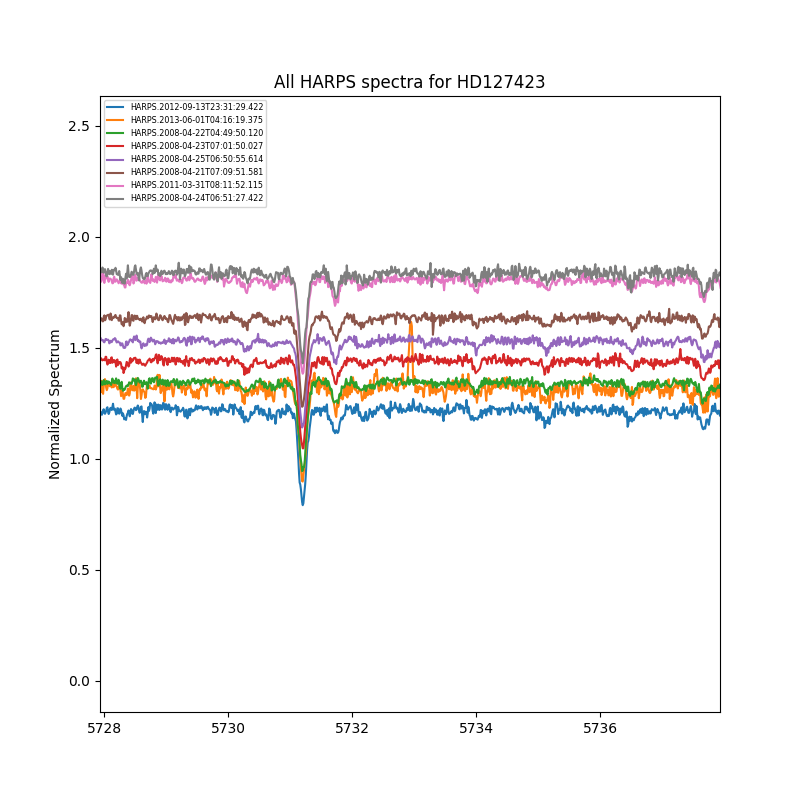

In [13]:
plt.figure(0)
plt.figure(0).set_size_inches(8,8)
plt.clf()
plot_speclist(fits_specfile_names,wavelim[which_target])
plt.title("All HARPS spectra for "+target_star[which_target])
plt.show()


Other observations taken on target date
--------------------------------
Query the ESO archive for all observations taken an hour before to an hour after the candidate observation.

In [14]:
samenight_tbl = eso.query_surveys('HARPS',date_obs=target_date[which_target])
samenight_tbl.pprint()
samenight_fits_specfile_names=download_if_not_cached(samenight_tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-10-06T10:04:23.740 HD107181 ...       --
ADP.2014-10-06T10:07:24.777 HD128356 ...       --
ADP.2014-10-06T10:04:46.673 HD126535 ...       --
ADP.2014-10-06T10:06:38.740 HD127423 ...       --
ADP.2014-10-06T10:04:27.593 HD143120 ...       --
ADP.2014-10-06T10:05:04.550 HD143361 ...       --
ADP.2014-10-06T10:04:15.887 HD144899 ...       --
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_23.740.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_07_24.777.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_46.673.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_06_38.740.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_27.593.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_05_04.550.fits exists
C:\Users\goodm\.astropy\cache\astroquery

Plot the spectra for each star.  Emission lines near the target wavelength are seen in several spectra.  Plot in both the spectrum's default reference frame and in the stars' doppler-shifted frame.  Absorption lines line up in the stars' reference frame but the emission lines do not, indicating that the emission is not coming from the stars.

In [15]:
def plot_speclist_doppler(fits_specfile_names):
    rawfilenames = get_rawfilenames(fits_specfile_names)
    specfits = [fits.open(f) for f in fits_specfile_names]
    radvels = [f[0].header["HIERARCH ESO TEL TARG RADVEL"] for f in specfits]  # Radial velocity of star in barycentric frame
    berv    = [f[0].header["HIERARCH ESO DRS BERV"] for f in specfits]         # Observatory's velocity in barycentric frame
    wave = [f[1].data[0][0] for f in specfits]
    wave_starframe = [doppler(wave[i],radvels[i]) for i in range(len(radvels))]
    wave_obsframe = [doppler(wave[i],berv[i]) for i in range(len(radvels))]
    arr1 = [f[1].data[0][1] for f in specfits]

    plt.subplot(3,1,1)
    plot_spectra(wave,arr1,wavelim[which_target])
    plt.title("All HARPS spectra between "+target_date[which_target])
    plt.legend(rawfilenames,loc='upper left',fontsize='xx-small')
    topax = plt.gca()

    plt.subplot(3,1,2,sharex=topax,sharey=topax)
    plot_spectra(wave_starframe,arr1,wavelim[which_target])
    plt.title('Doppler shifted into stellar frame')

    plt.subplot(3,1,3,sharex=topax,sharey=topax)
    plot_spectra(wave_obsframe,arr1,wavelim[which_target])
    plt.title('Doppler shifted into Earth frame')

    plt.subplots_adjust(wspace=.5,hspace=.5)


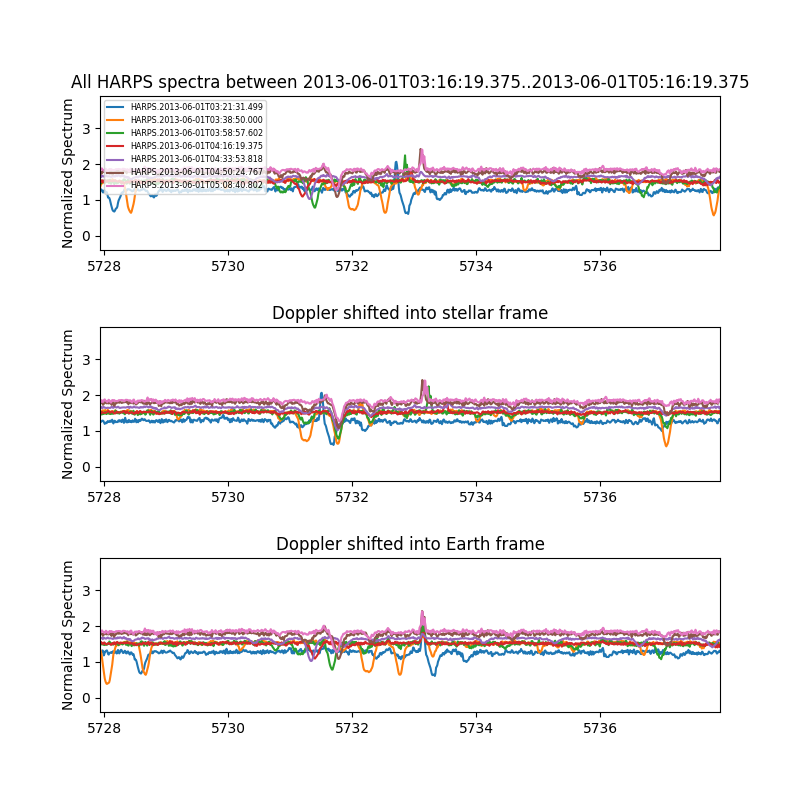

In [16]:
plt.figure(1)
plt.figure(1).set_size_inches(8,8)
plt.clf()
plot_speclist_doppler(samenight_fits_specfile_names)
plt.show()

# HIP59341

Repeat the same analysis for HIP59341

In [17]:
which_target = 0
target_star[which_target]

'HIP59341'

In [18]:
tbl = eso.query_surveys('HARPS',target=target_star[which_target],box=0.1)
print(tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-10-06T10:06:48.203 HD105750 ...       --
ADP.2014-10-06T10:04:35.730 HD105750 ...       --
ADP.2014-10-06T10:08:01.220 HD105750 ...       --
ADP.2014-10-06T10:04:49.020 HD105750 ...       --
ADP.2014-10-06T10:07:04.443 HD105750 ...       --
ADP.2014-09-25T15:37:24.840 HD105750 ...       --
ADP.2014-09-18T12:13:25.263 HD105750 ...       --
ADP.2014-09-18T12:14:30.733 HD105750 ...       --
ADP.2014-09-25T15:35:42.677 HD105750 ...       --


In [19]:
fits_specfile_names=download_if_not_cached(tbl)
get_rawfilenames(fits_specfile_names)

C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_06_48.203.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_35.730.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_08_01.220.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_49.020.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_07_04.443.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-25T15_37_24.840.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-18T12_13_25.263.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-18T12_14_30.733.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-25T15_35_42.677.fits exists


['HARPS.2013-05-31T02:56:39.965',
 'HARPS.2013-06-01T03:04:25.906',
 'HARPS.2013-06-18T02:09:34.253',
 'HARPS.2013-05-30T02:47:58.100',
 'HARPS.2013-06-19T02:21:42.405',
 'HARPS.2011-03-29T04:28:01.572',
 'HARPS.2008-04-22T05:26:12.974',
 'HARPS.2008-04-23T06:07:47.830',
 'HARPS.2011-08-15T00:06:21.568']

Plot all repeat observations of this star.

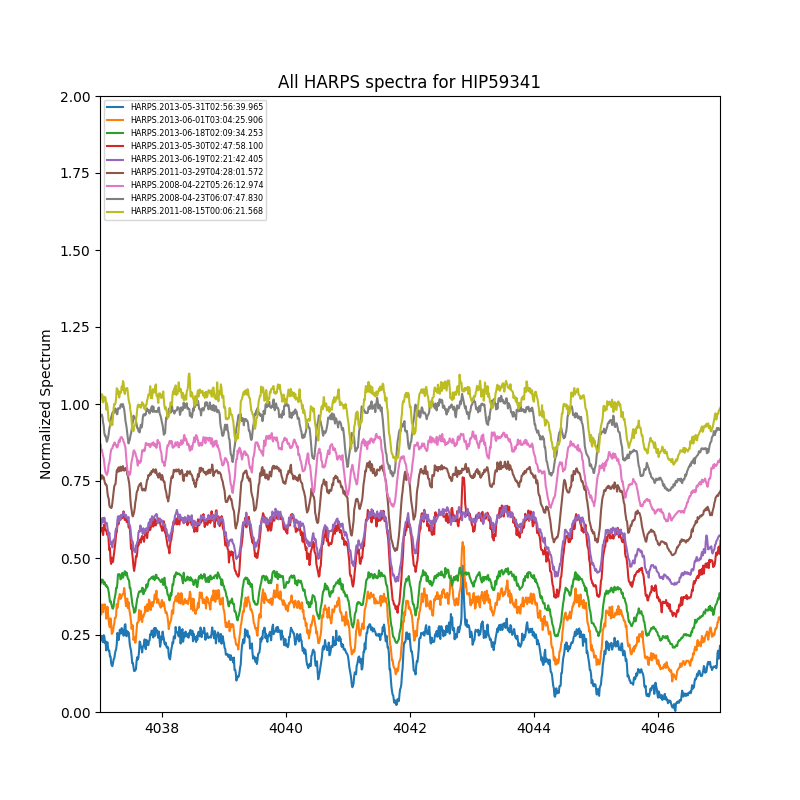

In [20]:
plt.figure(2)
plt.figure(2).set_size_inches(8,8)
plt.clf()
plot_speclist(fits_specfile_names,wavelim[which_target])
plt.title("All HARPS spectra for "+target_star[which_target])
plt.ylim(0,2)
plt.show()

Other observations on the same night:

In [21]:
samenight_tbl = eso.query_surveys('HARPS',date_obs=target_date[which_target])
samenight_tbl.pprint()
samenight_fits_specfile_names=download_if_not_cached(samenight_tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-10-06T10:07:05.397 HD101348 ...       --
ADP.2014-10-06T10:04:26.370 HD106937 ...       --
ADP.2014-10-06T10:04:23.987 HD102196 ...       --
ADP.2014-10-06T10:04:35.730 HD105750 ...       --
ADP.2014-10-06T10:04:23.740 HD107181 ...       --
ADP.2014-10-06T10:07:24.777 HD128356 ...       --
ADP.2014-10-06T10:04:46.673 HD126535 ...       --
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_07_05.397.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_26.370.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_23.987.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_35.730.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_23.740.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_07_24.777.fits exists
C:\Users\goodm\.astropy\cache\astroquery

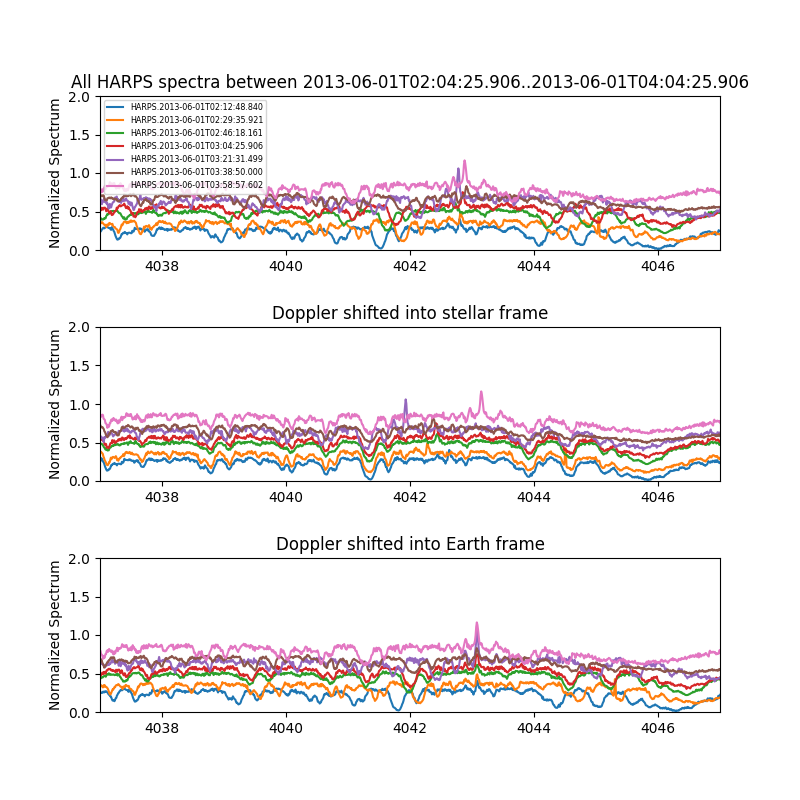

In [22]:
plt.figure(3)
plt.figure(3).set_size_inches(8,8)
plt.clf()
plot_speclist_doppler(samenight_fits_specfile_names)
plt.ylim(0,2)
plt.show()

# CD-312415

Repeat the same analysis for CD-312415

In [23]:
which_target = 1
target_star[which_target]

'CD-312415'

In [24]:
tbl = eso.query_surveys('HARPS',target=target_star[which_target],box=0.1)
print(tbl)

          ARCFILE                 Object      ... REFERENC
--------------------------- ----------------- ... --------
ADP.2017-09-27T01:01:22.330 NG0524-3056-22551 ...       --
ADP.2017-09-25T01:01:22.704 NG0524-3056-22551 ...       --
ADP.2017-09-24T01:01:24.278 NG0524-3056-22551 ...       --
ADP.2018-02-12T01:02:31.348 NG0524-3056-22551 ...       --
ADP.2017-09-22T01:01:40.589 NG0524-3056-22551 ...       --


In [25]:
fits_specfile_names=download_if_not_cached(tbl)
get_rawfilenames(fits_specfile_names)

C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-09-27T01_01_22.330.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-09-25T01_01_22.704.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-09-24T01_01_24.278.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-02-12T01_02_31.348.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-09-22T01_01_40.589.fits exists


['HARPS.2017-09-26T08:59:44.197',
 'HARPS.2017-09-24T09:20:16.081',
 'HARPS.2017-09-23T09:16:31.475',
 'HARPS.2018-02-11T01:10:40.579',
 'HARPS.2017-09-21T08:11:19.590']

Plot all repeat observations of this star.

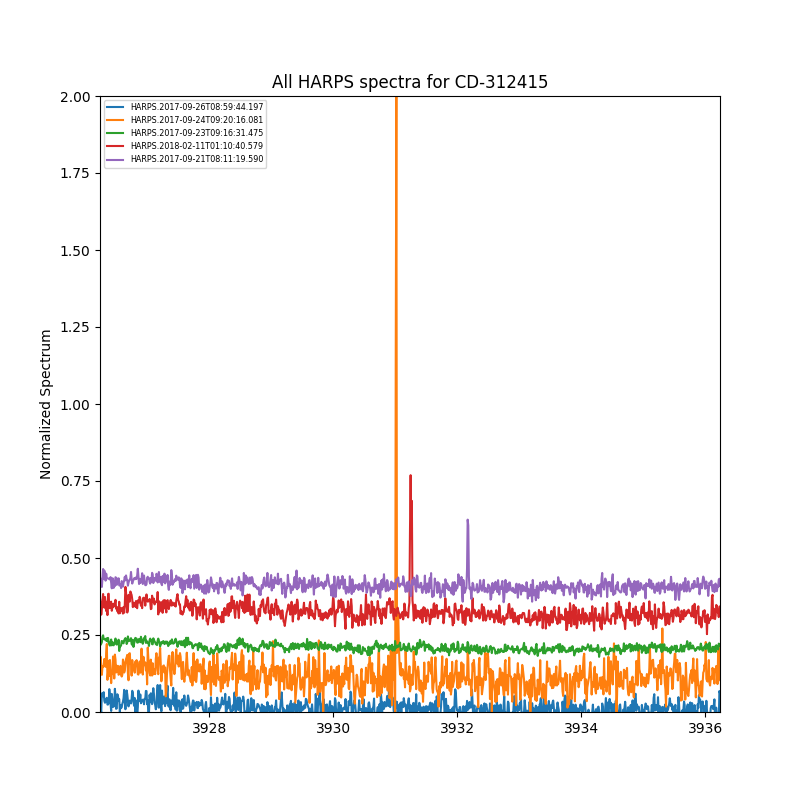

In [26]:
plt.figure(4)
plt.figure(4).set_size_inches(8,8)
plt.clf()
wavelim[which_target]
plot_speclist(fits_specfile_names,wavelim[which_target])
plt.title("All HARPS spectra for "+target_star[which_target])
plt.ylim(0,2)
plt.show()

Other observations on the same night:

In [27]:
samenight_tbl = eso.query_surveys('HARPS',date_obs=target_date[which_target])
samenight_tbl.pprint()
samenight_fits_specfile_names=download_if_not_cached(samenight_tbl)

          ARCFILE                 Object      ... REFERENC
--------------------------- ----------------- ... --------
ADP.2018-02-12T01:02:31.348 NG0524-3056-22551 ...       --
ADP.2018-02-12T01:02:31.358 NG0509-3345-23539 ...       --
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-02-12T01_02_31.348.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-02-12T01_02_31.358.fits exists


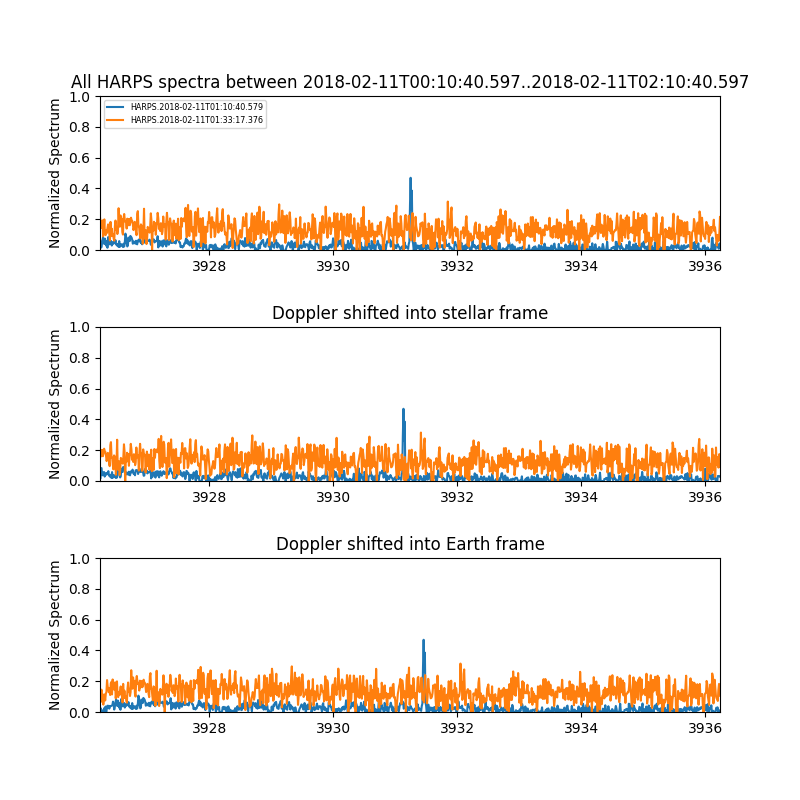

In [28]:
plt.figure(5)
plt.figure(5).set_size_inches(8,8)
plt.clf()
plot_speclist_doppler(samenight_fits_specfile_names)
plt.ylim(0,1)
plt.show()

# GJ317

Repeat the same analysis for GJ317

In [29]:
which_target = 2
target_star[which_target]

'GJ317'

In [30]:
tbl = eso.query_surveys('HARPS',target=target_star[which_target],box=0.1)
print(tbl)

          ARCFILE           Object ... REFERENC
--------------------------- ------ ... --------
ADP.2017-02-09T01:01:25.065  GJ317 ...       --
ADP.2014-09-26T16:54:08.527  GJ317 ...       --
ADP.2014-10-07T08:34:19.500 GJ-317 ...       --
ADP.2017-11-25T01:01:42.832  GJ317 ...       --
ADP.2018-03-25T01:02:04.027  GJ317 ...       --
ADP.2018-03-27T01:02:23.053  GJ317 ...       --
ADP.2018-04-11T01:01:47.531  GJ317 ...       --
ADP.2018-04-08T01:02:02.285  GJ317 ...       --
ADP.2018-03-23T01:01:49.768  GJ317 ...       --
ADP.2014-10-06T10:07:55.090 GJ-317 ...       --
                        ...    ... ...      ...
ADP.2014-10-06T10:05:59.680 GJ-317 ...       --
ADP.2014-10-07T08:35:12.727 GJ-317 ...       --
ADP.2018-06-03T01:02:30.761  GJ317 ...       --
ADP.2018-06-09T01:02:59.477  GJ317 ...       --
ADP.2016-12-12T01:02:43.503  GJ317 ...       --
ADP.2017-03-03T01:01:59.251  GJ317 ...       --
ADP.2017-12-26T01:01:18.883  GJ317 ...       --
ADP.2014-10-07T08:35:25.750 GJ-317 ...  

In [31]:
fits_specfile_names=download_if_not_cached(tbl)
get_rawfilenames(fits_specfile_names)

C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-02-09T01_01_25.065.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_54_08.527.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-07T08_34_19.500.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-11-25T01_01_42.832.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-03-25T01_02_04.027.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-03-27T01_02_23.053.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-04-11T01_01_47.531.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-04-08T01_02_02.285.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-03-23T01_01_49.768.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_07_55.090.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-12-02T01_01_27.552.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-04-10T14_59

['HARPS.2017-02-08T03:43:33.178',
 'HARPS.2012-11-15T05:01:53.760',
 'HARPS.2014-01-09T01:34:58.764',
 'HARPS.2017-11-24T08:27:33.926',
 'HARPS.2018-03-24T03:41:46.982',
 'HARPS.2018-03-26T02:02:36.301',
 'HARPS.2018-04-10T03:25:08.275',
 'HARPS.2018-04-07T02:26:55.799',
 'HARPS.2018-03-22T03:34:23.515',
 'HARPS.2013-12-30T02:24:18.551',
 'HARPS.2017-12-01T07:46:24.869',
 'HARPS.2018-04-09T03:16:29.715',
 'HARPS.2018-04-08T02:54:14.383',
 'HARPS.2013-05-09T23:22:59.592',
 'HARPS.2013-12-31T02:28:12.727',
 'HARPS.2018-01-12T07:28:48.542',
 'HARPS.2014-01-02T06:19:11.275',
 'HARPS.2014-01-09T01:55:30.509',
 'HARPS.2018-03-21T02:49:16.395',
 'HARPS.2013-05-08T23:36:19.155',
 'HARPS.2012-05-17T23:32:18.369',
 'HARPS.2014-01-03T08:04:06.704',
 'HARPS.2018-01-11T07:32:52.859',
 'HARPS.2018-01-14T07:56:22.549',
 'HARPS.2014-01-03T06:10:54.738',
 'HARPS.2014-01-01T06:40:12.496',
 'HARPS.2013-12-31T06:28:28.345',
 'HARPS.2012-05-11T23:12:04.827',
 'HARPS.2013-05-04T23:40:06.034',
 'HARPS.2013-0

Plot all repeat observations of this star.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


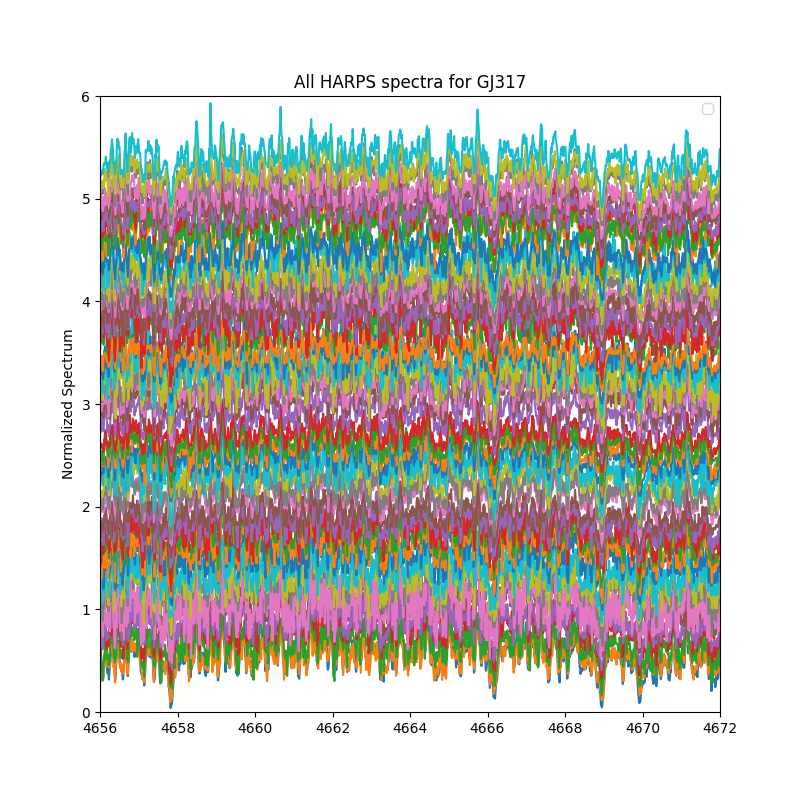

In [32]:
plt.figure(6)
plt.figure(6).set_size_inches(8,8)
plt.clf()
wavelim[which_target]
plot_speclist(fits_specfile_names,wavelim[which_target])
plt.title("All HARPS spectra for "+target_star[which_target])
plt.ylim(0,6)
plt.legend(loc='upper right')
plt.show()

Other observations on the same night:

In [33]:
samenight_tbl = eso.query_surveys('HARPS',date_obs=target_date[which_target])
samenight_tbl.pprint()
samenight_fits_specfile_names=download_if_not_cached(samenight_tbl)

          ARCFILE              Object   ... REFERENC
--------------------------- ----------- ... --------
ADP.2018-04-11T01:01:47.529 2M1129-0127 ...       --
ADP.2018-04-11T01:01:47.531       GJ317 ...       --
ADP.2018-04-11T01:01:47.517     HD90722 ...       --
ADP.2018-04-11T01:01:47.527    HD106290 ...       --
ADP.2018-04-11T01:01:47.535    HD108202 ...       --
ADP.2018-04-11T01:01:47.539    HD108768 ...       --
ADP.2018-04-11T01:01:47.537    HD113569 ...       --
ADP.2018-04-11T01:01:47.541    J1141-37 ...       --
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-04-11T01_01_47.529.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-04-11T01_01_47.531.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-04-11T01_01_47.517.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-04-11T01_01_47.527.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2018-04-11T01_01_47.535.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\

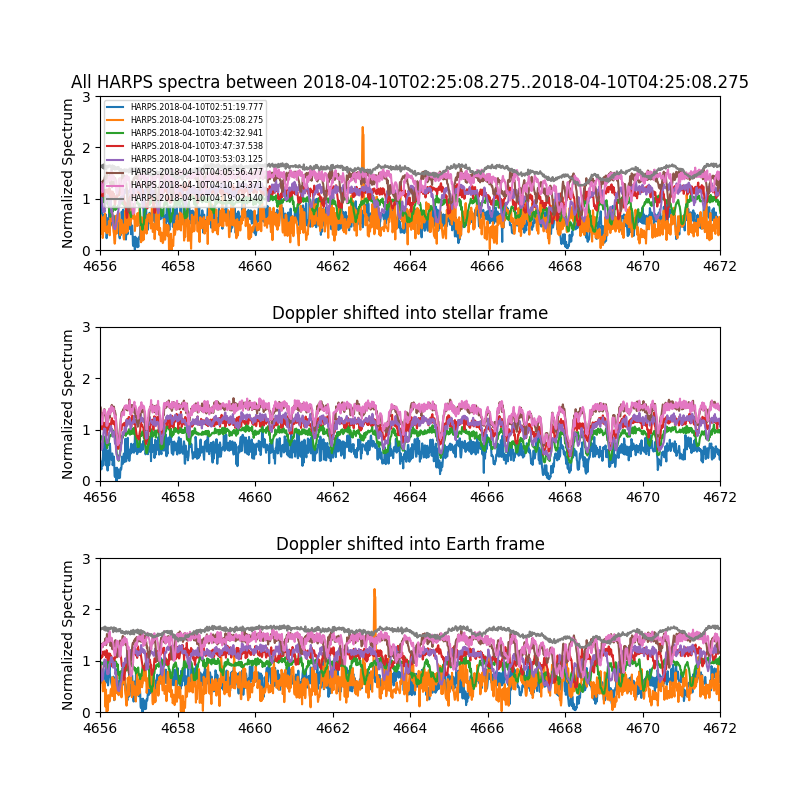

In [34]:
plt.figure(7)
plt.figure(7).set_size_inches(8,8)
plt.clf()
plot_speclist_doppler(samenight_fits_specfile_names)
plt.ylim(0,3)
plt.show()

Note the stellar doppler shift data is missing for the target star.

# HD96673

Repeat the same analysis for HD96673

In [35]:
which_target = 4
target_star[which_target]

'HD96673'

In [36]:
tbl = eso.query_surveys('HARPS',target=target_star[which_target],box=0.1)
print(tbl)

          ARCFILE            Object ... REFERENC
--------------------------- ------- ... --------
ADP.2014-09-16T11:04:12.733 HD96673 ...       --
ADP.2014-09-16T11:06:51.280 HD96673 ...       --
ADP.2014-09-16T11:04:43.497 HD96673 ...       --
ADP.2014-09-16T11:05:09.427 HD96673 ...       --
ADP.2014-09-25T15:33:30.363 HD96673 ...       --
ADP.2014-09-16T11:05:32.360 HD96673 ...       --
ADP.2014-10-01T10:20:12.923 HD96673 ...       --
ADP.2014-10-01T10:20:18.490 HD96673 ...       --


In [37]:
fits_specfile_names=download_if_not_cached(tbl)
get_rawfilenames(fits_specfile_names)

C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_04_12.733.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_06_51.280.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_04_43.497.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_05_09.427.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-25T15_33_30.363.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_05_32.360.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-01T10_20_12.923.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-01T10_20_18.490.fits exists


['HARPS.2006-05-31T00:35:03.252',
 'HARPS.2006-01-28T07:17:55.086',
 'HARPS.2006-06-01T01:01:27.212',
 'HARPS.2006-02-21T06:48:54.765',
 'HARPS.2011-04-13T04:53:04.979',
 'HARPS.2006-02-20T07:51:33.432',
 'HARPS.2004-02-12T06:48:02.789',
 'HARPS.2004-02-21T06:53:58.892']

Plot all repeat observations of this star.

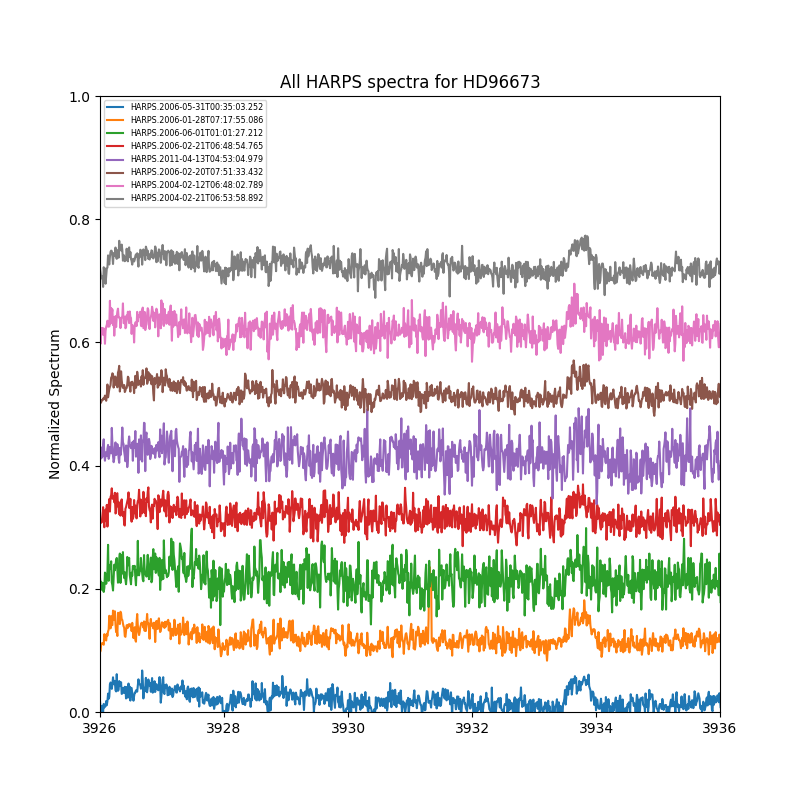

In [38]:
plt.figure(8)
plt.figure(8).set_size_inches(8,8)
plt.clf()
wavelim[which_target]
plot_speclist(fits_specfile_names,wavelim[which_target])
plt.title("All HARPS spectra for "+target_star[which_target])
plt.ylim(0,1)
plt.show()

Other observations on the same night:

In [39]:
samenight_tbl = eso.query_surveys('HARPS',date_obs=target_date[which_target])
samenight_tbl.pprint()
samenight_fits_specfile_names=download_if_not_cached(samenight_tbl)

          ARCFILE              Object   ... REFERENC
--------------------------- ----------- ... --------
ADP.2014-09-16T11:04:28.937     HD85390 ...       --
ADP.2014-09-16T11:05:01.940    HIP49889 ...       --
ADP.2014-09-16T11:04:47.740     HD90133 ...       --
ADP.2014-09-16T11:04:09.203     HD94964 ...       --
ADP.2014-09-16T11:06:51.280     HD96673 ...       --
ADP.2014-09-16T11:04:37.960 IC2714No220 ...       --
ADP.2014-09-16T11:06:54.380    HIP54597 ...       --
ADP.2014-09-16T11:04:32.930     HD90081 ...       --
ADP.2014-09-16T11:07:27.737     HD91379 ...       --
ADP.2014-09-16T11:07:00.543       Gl436 ...       --
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_04_28.937.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_05_01.940.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_04_47.740.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-16T11_04_09.203.fits exists
C:\Users\goodm\.astropy\

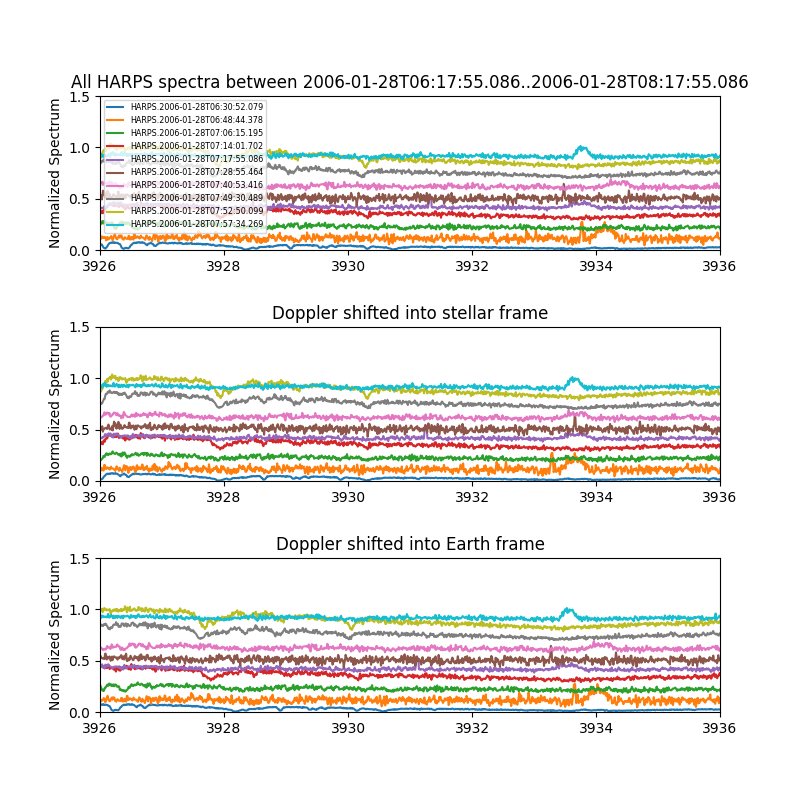

In [40]:
plt.figure(9)
plt.figure(9).set_size_inches(8,8)
plt.clf()
plot_speclist_doppler(samenight_fits_specfile_names)
plt.ylim(0,1.5)
plt.show()

# HIP87607 (2012-10-22T23:39:09.238) 

Repeat the same analysis for HIP87607 (2012-10-22T23:39:09.238)

In [41]:
which_target = 5
target_star[which_target]

'HIP87607'

In [42]:
tbl = eso.query_surveys('HARPS',target=target_star[which_target],box=0.1)
print(tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-09-26T16:54:29.313 HIP87607 ...       --
ADP.2014-09-26T16:52:17.823 HIP87607 ...       --
ADP.2014-10-06T10:04:15.220 HIP87607 ...       --
ADP.2015-05-06T23:55:28.393 HIP87607 ...       --
ADP.2014-09-26T16:52:22.090 HIP87607 ...       --
ADP.2019-07-20T01:13:05.981 HIP87607 ...       --
ADP.2014-10-07T08:35:13.993 HIP87607 ...       --
ADP.2014-10-06T10:07:06.050 HIP87607 ...       --
ADP.2014-10-06T10:03:50.863 HIP87607 ...       --
ADP.2017-05-10T01:02:52.401 HIP87607 ...       --
ADP.2014-10-06T10:04:01.373 HIP87607 ...       --
ADP.2014-09-25T15:37:16.380 HIP87607 ...       --
ADP.2014-09-16T11:05:30.087 HIP87607 ...       --
ADP.2014-09-24T09:42:03.117 HIP87607 ...       --
ADP.2014-10-06T10:05:51.713 HIP87607 ...       --
ADP.2014-09-23T11:01:50.807 HIP87607 ...       --
ADP.2014-09-23T11:02:06.180 HIP87607 ...       --
ADP.2014-09-23T11:05:35.523 HIP87607 ...       --


In [43]:
fits_specfile_names=download_if_not_cached(tbl)
get_rawfilenames(fits_specfile_names)

C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_54_29.313.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_17.823.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_15.220.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2015-05-06T23_55_28.393.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_22.090.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2019-07-20T01_13_05.981.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-07T08_35_13.993.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_07_06.050.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_03_50.863.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-05-10T01_02_52.401.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_01.373.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-25T15_37

['HARPS.2012-08-27T02:54:36.377',
 'HARPS.2012-10-22T23:39:09.238',
 'HARPS.2013-04-30T09:50:45.212',
 'HARPS.2015-05-06T08:42:41.110',
 'HARPS.2012-08-11T01:11:14.694',
 'HARPS.2019-07-19T04:29:26.926',
 'HARPS.2014-04-14T08:37:07.870',
 'HARPS.2013-10-17T01:05:58.009',
 'HARPS.2013-07-24T02:37:41.553',
 'HARPS.2017-05-09T08:22:45.544',
 'HARPS.2013-03-31T08:25:02.332',
 'HARPS.2011-04-13T08:14:15.066',
 'HARPS.2006-09-03T03:02:50.007',
 'HARPS.2010-06-28T02:42:20.095',
 'HARPS.2013-08-18T05:02:20.353',
 'HARPS.2009-07-05T04:43:34.326',
 'HARPS.2009-04-10T09:11:36.057',
 'HARPS.2009-07-01T07:20:47.738']

Plot all repeat observations of this star.

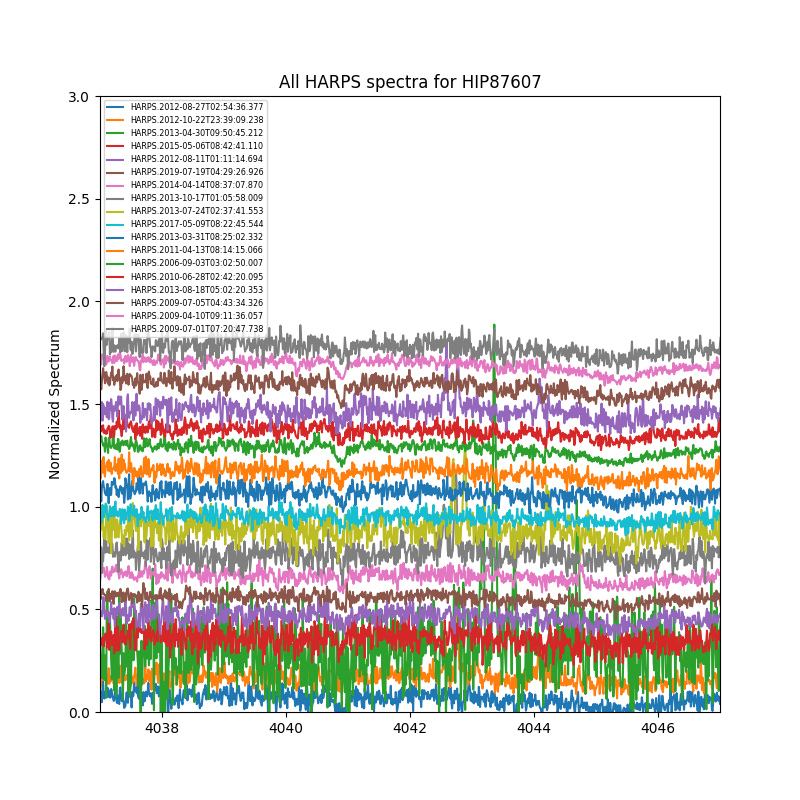

In [44]:
plt.figure(10)
plt.figure(10).set_size_inches(8,8)
plt.clf()
wavelim[which_target]
plot_speclist(fits_specfile_names,wavelim[which_target])
plt.title("All HARPS spectra for "+target_star[which_target])
plt.ylim(0,3)
plt.show()

Other observations on the same night:

In [45]:
samenight_tbl = eso.query_surveys('HARPS',date_obs=target_date[which_target])
samenight_tbl.pprint()
samenight_fits_specfile_names=download_if_not_cached(samenight_tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-09-26T16:52:17.823 HIP87607 ...       --
ADP.2014-09-26T16:51:34.173 HD192961 ...       --
ADP.2014-09-26T16:53:53.927 HD213628 ...       --
ADP.2014-09-26T16:52:00.360 HD215456 ...       --
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_17.823.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_51_34.173.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_53_53.927.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_00.360.fits exists


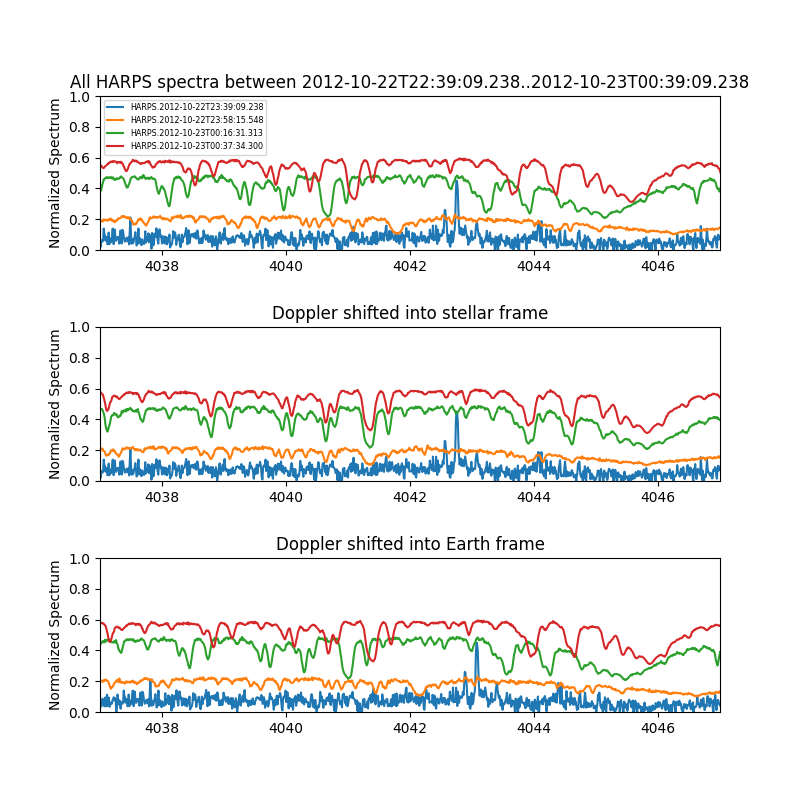

In [46]:
plt.figure(11)
plt.figure(11).set_size_inches(8,8)
plt.clf()
plot_speclist_doppler(samenight_fits_specfile_names)
plt.ylim(0,1)
plt.show()

# HIP87607 (2013-04-30T09:50:45.212)

Repeat the same analysis for HIP87607 (2013-04-30T09:50:45.212)

In [47]:
which_target = 6
target_star[which_target]
wavelim[which_target]

[5449, 5459]

In [48]:
tbl = eso.query_surveys('HARPS',target=target_star[which_target],box=0.1)
print(tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-09-26T16:54:29.313 HIP87607 ...       --
ADP.2014-09-26T16:52:17.823 HIP87607 ...       --
ADP.2014-10-06T10:04:15.220 HIP87607 ...       --
ADP.2015-05-06T23:55:28.393 HIP87607 ...       --
ADP.2014-09-26T16:52:22.090 HIP87607 ...       --
ADP.2019-07-20T01:13:05.981 HIP87607 ...       --
ADP.2014-10-07T08:35:13.993 HIP87607 ...       --
ADP.2014-10-06T10:07:06.050 HIP87607 ...       --
ADP.2014-10-06T10:03:50.863 HIP87607 ...       --
ADP.2017-05-10T01:02:52.401 HIP87607 ...       --
ADP.2014-10-06T10:04:01.373 HIP87607 ...       --
ADP.2014-09-25T15:37:16.380 HIP87607 ...       --
ADP.2014-09-16T11:05:30.087 HIP87607 ...       --
ADP.2014-09-24T09:42:03.117 HIP87607 ...       --
ADP.2014-10-06T10:05:51.713 HIP87607 ...       --
ADP.2014-09-23T11:01:50.807 HIP87607 ...       --
ADP.2014-09-23T11:02:06.180 HIP87607 ...       --
ADP.2014-09-23T11:05:35.523 HIP87607 ...       --


In [49]:
fits_specfile_names=download_if_not_cached(tbl)
get_rawfilenames(fits_specfile_names)

C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_54_29.313.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_17.823.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_15.220.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2015-05-06T23_55_28.393.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_22.090.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2019-07-20T01_13_05.981.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-07T08_35_13.993.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_07_06.050.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_03_50.863.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2017-05-10T01_02_52.401.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_01.373.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-25T15_37

['HARPS.2012-08-27T02:54:36.377',
 'HARPS.2012-10-22T23:39:09.238',
 'HARPS.2013-04-30T09:50:45.212',
 'HARPS.2015-05-06T08:42:41.110',
 'HARPS.2012-08-11T01:11:14.694',
 'HARPS.2019-07-19T04:29:26.926',
 'HARPS.2014-04-14T08:37:07.870',
 'HARPS.2013-10-17T01:05:58.009',
 'HARPS.2013-07-24T02:37:41.553',
 'HARPS.2017-05-09T08:22:45.544',
 'HARPS.2013-03-31T08:25:02.332',
 'HARPS.2011-04-13T08:14:15.066',
 'HARPS.2006-09-03T03:02:50.007',
 'HARPS.2010-06-28T02:42:20.095',
 'HARPS.2013-08-18T05:02:20.353',
 'HARPS.2009-07-05T04:43:34.326',
 'HARPS.2009-04-10T09:11:36.057',
 'HARPS.2009-07-01T07:20:47.738']

Plot all repeat observations of this star.

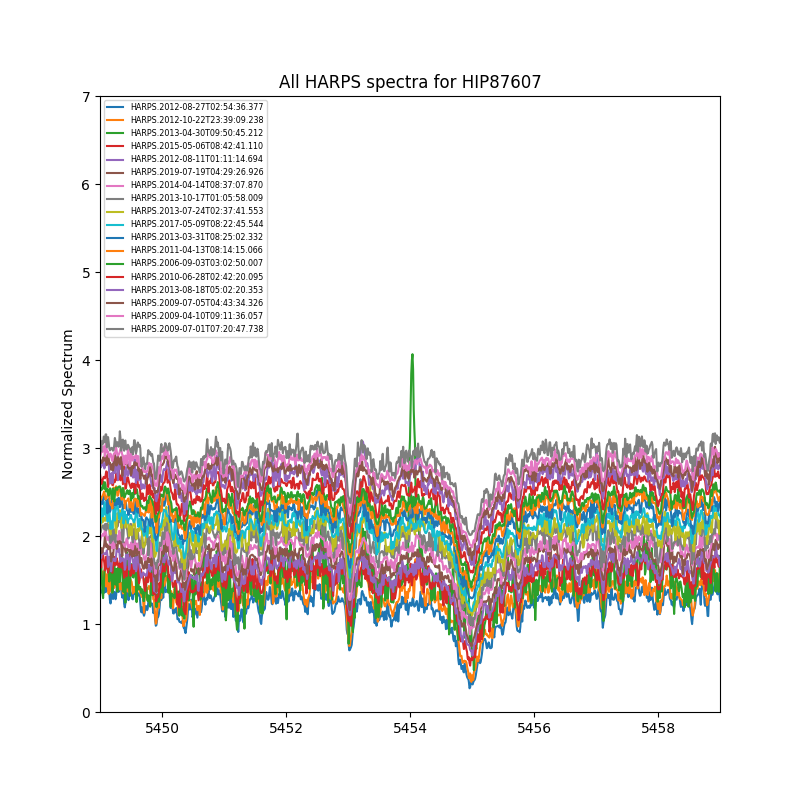

In [50]:
plt.figure(12)
plt.figure(12).set_size_inches(8,8)
plt.clf()
wavelim[which_target]
plot_speclist(fits_specfile_names,wavelim[which_target])
plt.title("All HARPS spectra for "+target_star[which_target])
plt.ylim(0,7)
plt.show()

Other observations on the same night:

In [51]:
samenight_tbl = eso.query_surveys('HARPS',date_obs=target_date[which_target])
samenight_tbl.pprint()
samenight_fits_specfile_names=download_if_not_cached(samenight_tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-10-06T10:07:57.473 HD154387 ...       --
ADP.2014-10-06T10:05:56.147 HIP83941 ...       --
ADP.2014-10-06T10:06:08.070 HIP84452 ...       --
ADP.2014-10-06T10:04:15.220 HIP87607 ...       --
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_07_57.473.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_05_56.147.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_06_08.070.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-06T10_04_15.220.fits exists


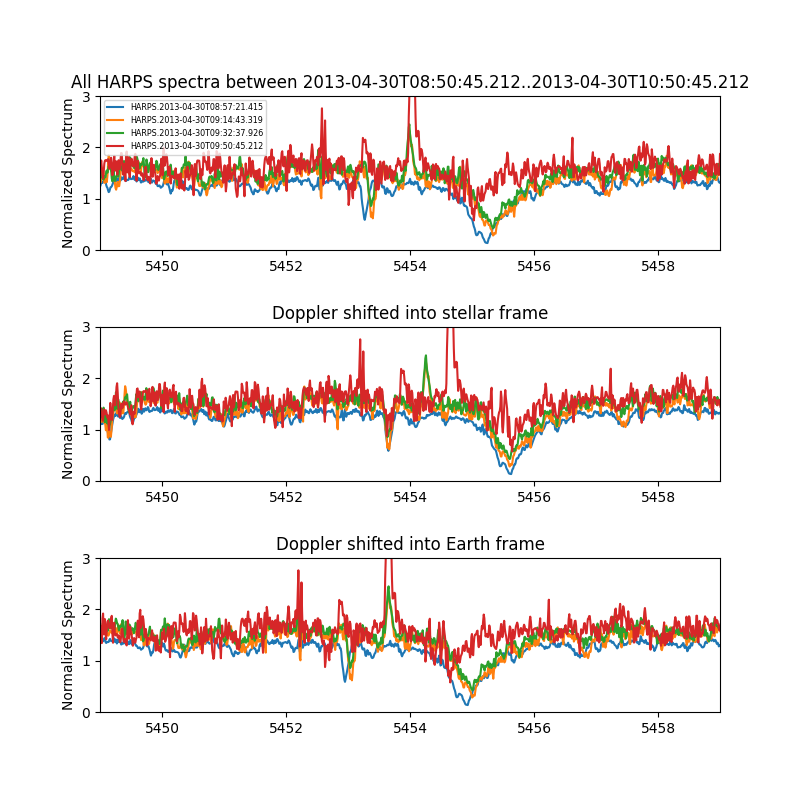

In [52]:
plt.figure(13)
plt.figure(13).set_size_inches(8,8)
plt.clf()
plot_speclist_doppler(samenight_fits_specfile_names)
plt.ylim(0,3)
plt.show()

# GJ4291

Repeat the same analysis for GJ4291

In [60]:
which_target = 7
target_star[which_target]
wavelim[which_target]

[3837, 3846]

In [61]:
tbl = eso.query_surveys('HARPS',target=target_star[which_target],box=0.1)
print(tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-10-02T10:00:50.267 HD215152 ...       --
ADP.2014-10-02T10:02:27.423 HD215152 ...       --
ADP.2014-10-02T09:59:22.727 HD215152 ...       --
ADP.2014-09-26T16:52:50.540 HD215152 ...       --
ADP.2014-09-26T16:51:46.850 HD215152 ...       --
ADP.2016-05-22T01:04:38.561 HD215152 ...       --
ADP.2014-09-26T16:51:48.163 HD215152 ...       --
ADP.2014-09-26T16:52:45.657 HD215152 ...       --
ADP.2014-09-26T16:52:07.570 HD215152 ...       --
ADP.2014-09-26T16:51:54.853 HD215152 ...       --
                        ...      ... ...      ...
ADP.2014-09-29T13:27:23.390 HD215152 ...       --
ADP.2014-09-26T16:51:37.550 HD215152 ...       --
ADP.2016-08-13T01:05:02.917 HD215152 ...       --
ADP.2014-09-26T16:52:04.677 HD215152 ...       --
ADP.2016-08-14T01:02:30.469 HD215152 ...       --
ADP.2014-09-26T16:53:39.903 HD215152 ...       --
ADP.2016-08-07T01:02:22.622 HD215152 ...       --


In [55]:
fits_specfile_names=download_if_not_cached(tbl)
get_rawfilenames(fits_specfile_names)

C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-02T10_00_50.267.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-02T10_02_27.423.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-02T09_59_22.727.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_50.540.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_51_46.850.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2016-05-22T01_04_38.561.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_51_48.163.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_45.657.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_52_07.570.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_51_54.853.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-10-02T10_00_16.163.fits exists
C:\Users\goodm\.astropy\cache\astroquery\Eso\ADP.2014-09-26T16_51

['HARPS.2005-07-20T03:49:48.810',
 'HARPS.2005-07-20T04:08:04.468',
 'HARPS.2005-07-20T04:26:00.352',
 'HARPS.2012-12-02T01:12:30.827',
 'HARPS.2012-11-16T02:03:51.859',
 'HARPS.2016-05-21T08:31:55.415',
 'HARPS.2012-11-26T23:59:56.603',
 'HARPS.2012-11-27T23:59:59.832',
 'HARPS.2012-11-25T00:37:25.186',
 'HARPS.2012-11-26T00:11:51.233',
 'HARPS.2005-07-20T04:47:07.045',
 'HARPS.2012-07-09T07:59:58.496',
 'HARPS.2012-12-01T00:30:50.344',
 'HARPS.2012-10-15T01:13:56.631',
 'HARPS.2012-10-20T04:22:01.445',
 'HARPS.2012-07-07T08:11:03.301',
 'HARPS.2016-06-30T05:46:09.678',
 'HARPS.2012-10-02T02:30:41.764',
 'HARPS.2012-10-09T02:48:54.584',
 'HARPS.2013-11-20T00:00:42.088',
 'HARPS.2011-10-07T01:53:08.871',
 'HARPS.2016-05-21T10:05:06.533',
 'HARPS.2016-07-15T08:56:59.283',
 'HARPS.2012-06-19T09:06:39.178',
 'HARPS.2016-07-01T09:08:40.633',
 'HARPS.2012-07-13T07:57:42.282',
 'HARPS.2016-07-01T08:00:05.551',
 'HARPS.2016-08-25T08:14:08.879',
 'HARPS.2016-08-13T08:46:35.460',
 'HARPS.2012-0

Plot all repeat observations of this star.

In [56]:
which_target

7

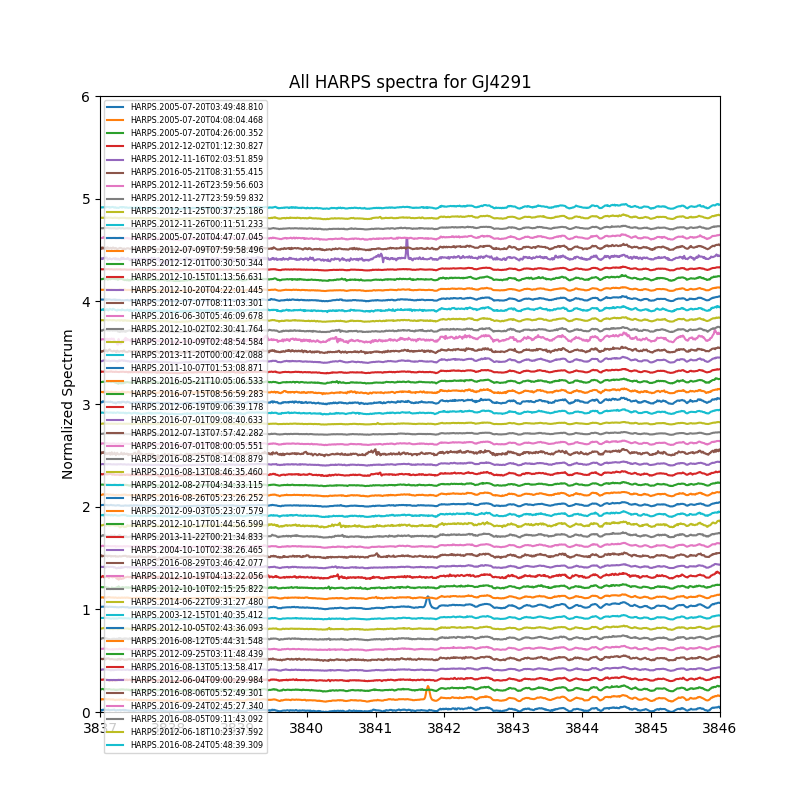

In [64]:
plt.figure(14)
plt.figure(14).set_size_inches(8,8)
plt.clf()
plot_speclist(fits_specfile_names,wavelim[which_target])
plt.title("All HARPS spectra for "+target_star[which_target])
plt.ylim(0,6)
plt.show()

Other observations on the same night:

In [58]:
samenight_tbl = eso.query_surveys('HARPS',date_obs=target_date[which_target])
samenight_tbl.pprint()
samenight_fits_specfile_names=download_if_not_cached(samenight_tbl)

          ARCFILE            Object  ... REFERENC
--------------------------- -------- ... --------
ADP.2014-10-02T10:02:17.573 HD162396 ...       --
ADP.2014-10-02T10:01:25.193 HD162396 ...       --
ADP.2014-10-02T10:03:29.783 HD162396 ...       --
ADP.2014-10-02T10:01:04.140 HD162396 ...       --
ADP.2014-10-02T10:02:20.123 HD162396 ...       --
ADP.2014-10-02T10:01:11.683 HD162396 ...       --
ADP.2014-10-02T10:03:50.563 HD162396 ...       --
ADP.2014-10-02T10:02:38.907 HD162396 ...       --
ADP.2014-10-02T10:01:10.677 HD162396 ...       --
ADP.2014-10-02T10:01:33.703 HD162396 ...       --
                        ...      ... ...      ...
ADP.2014-10-02T10:02:04.643 HD162396 ...       --
ADP.2014-10-02T09:59:29.790 HD162396 ...       --
ADP.2014-10-02T09:59:45.537 HD162396 ...       --
ADP.2014-10-02T09:59:39.503 HD162396 ...       --
ADP.2014-10-02T09:59:22.390 HD162396 ...       --
ADP.2014-10-02T10:02:26.113 HD196761 ...       --
ADP.2014-10-02T09:59:43.883 HD196761 ...       --


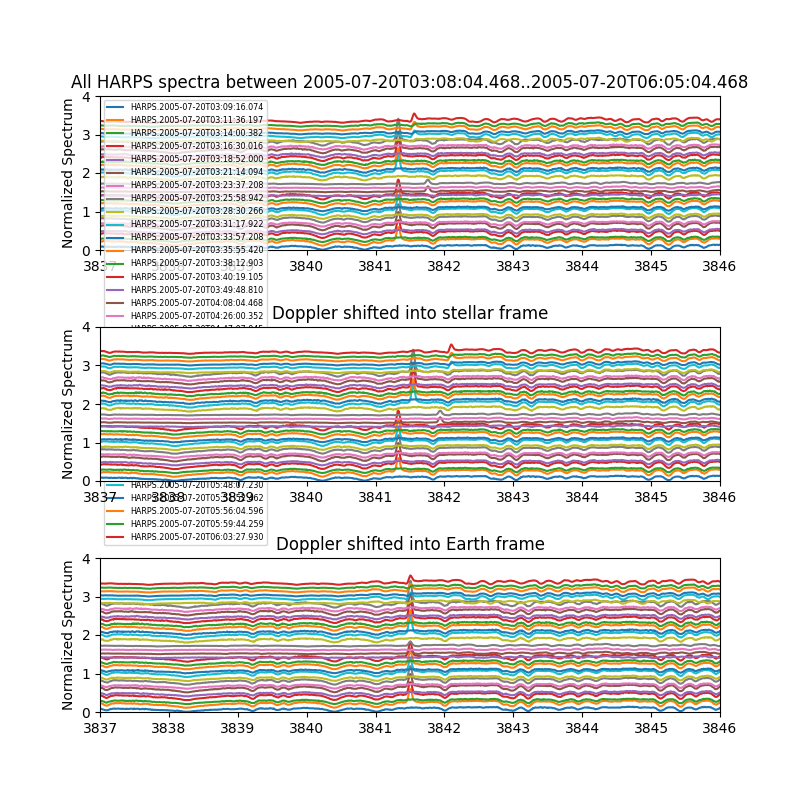

In [59]:
plt.figure(15)
plt.figure(15).set_size_inches(8,8)
plt.clf()
plot_speclist_doppler(samenight_fits_specfile_names)
plt.ylim(0,4)
plt.show()

# Conclusions

We find emission lines in the terrestrial reference frame for other stars observed on the same night, in the cases of

| Date                    | Star     | Terrestrial emission? |
|-------------------------|----------|-----------------------|
|2013-06-01T03:04:25.906  |HIP59341  | YES  |
|2018-02-11T01:10:40.597  |CD-312415 | NO (But only 2 obs that night) |
|2013-06-01T04:16:19.375  |HD127423  | YES |
|2018-04-10T03:25:08.275  |GJ317     | NO  |
|2006-01-28T07:17:55.086  |HD96673   | NO (but nearby airglow) |
|2012-10-22T23:39:09.238  |HIP87607  | NO  |
|2013-04-30T09:50:45.212  |HIP87607  | YES |
|2005-07-20T04:08:04.468  |GJ4291    | YES |
